# 3 - Tests for particles segmentation

Note: The number of particles will be too high for the uFTIR

The result should be one mask per image, which are going to be processed like the Apeer masks were (split into multiple masks, convert to coco) 

In the end, only the manually annotated images from saturated filters will be used to train a neural network. 

Check 1_splitrenameconvert.ipynb


# Convert V2 dataset to COCO

# Covert V3 Square images dataset to COCO


In [1]:
# imports
import os
import sys

import pathlib
import glob

import matplotlib.pyplot as plt
import PIL


import numpy as np

from IPython.display import Image, display

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image


import cv2

# paths

# paths

data_dir = "../../../0_DATA/IMPTOX"

# Contains three folders: /jpg, /bmp and /tif. 
#     The images are extracted from the raw data transmited by the FTIR team in UBFC
#     Each of these folder might contain a varying number of images
full_filter_dirs = data_dir + "/01-01_image_library/V2/0_FilesWP4/_full_filters"

full_filter_jpg = full_filter_dirs + "/jpg"
#full_filter_bmp = full_filter_dirs + "/bmp"
#full_filter_tif = full_filter_dirs + "/tif"

# Cropped images (without border and as few filter as possible)
cropped_filter_dirs = data_dir + "/01-01_image_library/V2/1_cropped_filters/"

cropped_filter_jpg = cropped_filter_dirs + "jpg/"
#cropped_filter_bmp = cropped_filter_dirs + "bmp/"
#cropped_filter_tif = cropped_filter_dirs + "tif/"


output_dir_tiles_jpg = data_dir + "/01-01_image_library/V2/2_752x480_tiles/jpg/"
#output_dir_tiles_jpg_v3 = data_dir + "/01-01_image_library/V3/2_752x480_tiles/jpg/"

# Images filenames
full_filter_jpg_list = [f for f in os.listdir(full_filter_jpg) if f.endswith('.jpg')]

# Images full relative paths
full_filter_jpg_path_list = [os.path.join(full_filter_jpg, f) for f in os.listdir(full_filter_jpg) if f.endswith('.jpg')]

# List of tiles extracted from selected saturated filters
paths_tiles_jpg = [f"{output_dir_tiles_jpg}{tile}" for tile in os.listdir(output_dir_tiles_jpg) ]


coco_annotations_dir = data_dir + "/01-01_image_library/V2/5_coco_annotations/"
output_json_file = coco_annotations_dir + ""

full_mask_annotations_dir = data_dir + "/01-01_image_library/V2/3_full_masks/"
split_mask_annotations_dir = data_dir + "/01-01_image_library/V2/5_coco_annotations/train/annotations"




if not os.path.exists(full_mask_annotations_dir):
    # If it doesn't exist, create it
    os.makedirs(full_mask_annotations_dir)
    
if not os.path.exists(split_mask_annotations_dir):
    # If it doesn't exist, create it
    os.makedirs(split_mask_annotations_dir)

In [2]:
# Paths of random images

img_path_1 = "../../../0_DATA/IMPTOX/01-01_image_library/V2/1_cropped_filters/jpg/cr_WP4_SRB_1_M_2_Mozaik.jpg"
img_path_2 = "../../../0_DATA/IMPTOX/01-01_image_library/V2/1_cropped_filters/jpg/cr_WP4_SRB_1_FRESH_3_Mozaik.jpg"
img_path_3 = "../../../0_DATA/IMPTOX/01-01_image_library/V2/1_cropped_filters/jpg/cr_WP4_SCH_V1_F_026_WP4_SCH_V1_F026_dark.jpg"


# UTILS



def display_ipython(path):
    # from IPython.display import Image, display
    display(PIL.Image.open(path))

    

def display_matplotlib(path):
    #import matplotlib.pyplot as plt
    #import numpy as np
    #from PIL import Image
    img = np.asarray(PIL.Image.open(path))
    imgplot = plt.imshow(img)
    return imgplot



In [ ]:
display_matplotlib(img_path_3)

### K-means clustering

From [here](https://www.thepythoncode.com/article/kmeans-for-image-segmentation-opencv-python). Way too inefficient and time consuming !

## SAM 

SAM has not been tested on saturated filters. 



In [ ]:




image = cv2.imread(img_path_1)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Crop the image to reduce size
image = image[500:1200, 500:1200]

print(image.shape)

image_w, image_h = image.shape[0], image.shape[1]

# Number of points per side for SAM auto segmentation
nb_points = image_w // 30 # Every N pixels
print(f"SAM with {nb_points} points per side.")

max_surface = image_w * image_h / 10 # biggest particle cannot be bigger thatn 10% of the whole image

In [ ]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor


#import sys
#sys.path.append("..")

sam_checkpoint = "/home/thibault.schowing/data-local/segment-anything/sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = 'cuda:0'

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)

mask_generator_ = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=nb_points,
    pred_iou_thresh=0.8,
    stability_score_thresh=0.96,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=50,  # Requires open-cv to run post-processing
)

masks = mask_generator_.generate(image)

print(len(masks))



In [ ]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))    



def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)
    polygons = []
    color = []
    for ann in sorted_anns:
        m = ann['segmentation']
        img = np.ones((m.shape[0], m.shape[1], 3))
        #color_mask = np.random.random((1, 3)).tolist()[0]
        color_mask = [0,1,0]
        for i in range(3):
            img[:,:,i] = color_mask[i]
        ax.imshow(np.dstack((img, m*0.35)))




"""
Mask generation returns a list over masks, where each mask is a dictionary containing various data about the mask. These keys are:
segmentation : the mask
area : the area of the mask in pixels
bbox : the boundary box of the mask in XYWH format
predicted_iou : the model's own prediction for the quality of the mask
point_coords : the sampled input point that generated this mask
stability_score : an additional measure of mask quality
crop_box : the crop of the image used to generate this mask in XYWH format
"""

### SAM results

The results are in the variable masks. Complexe data structure but should be exportable in coco !

The image display takes a lot of time. 

In [ ]:
import seaborn as sns


In [ ]:
m = [s['segmentation'] for s in masks]

#print(len(m)) # 94 particles
pixel_particle_sizes = [annot.sum() for annot in m]



Particules de moins de 100px uniquement

In [ ]:
sorted_anns = sorted(masks, key=(lambda x: x['area']), reverse=True)
print(len(sorted_anns))
filtered_sorted_anns = [ann for ann in sorted_anns if ann['area'] < max_surface]
print(len(filtered_sorted_anns))

#print(filtered_sorted_anns)

In [ ]:
# Takes time !!!
plt.figure(figsize=(50,50))
plt.imshow(image)
show_anns(filtered_sorted_anns)
plt.axis('off')
plt.show() 

#### SAM and image pre-processing


Sharp edges and variation in start points

In [ ]:
# Image
#original_image = image

# create a sharpening kernel
#sharpen_filter=np.array([[-1,-1,-1],
#                 [-1,7,-1],
#                [-1,-1,-1]])
# applying kernels to the input image to get the sharpened image
#sharp_image=cv2.filter2D(original_image,-1,sharpen_filter)

#cv2.imshow('Required image',sharp_image)

# Canny edge detector and sharpening


Using classic image processing methods, generate coco annotations. 

Reproduce complexe but working structure as with Apeer. 




In [ ]:
img = cv2.imread(img_path_3)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Blur
img = cv2.GaussianBlur(img,(5,5),cv2.BORDER_DEFAULT)

# Sharpen
kernel = np.array([[0, -1, 0],
                   [-1, 5,-1],
                   [0, -1, 0]])
img = cv2.filter2D(src=img, ddepth=-1, kernel=kernel)








assert img is not None, "file could not be read, check with os.path.exists()"
edges = cv2.Canny(img,110,110)

plt.figure(figsize=(20,10))
plt.subplot(121),plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
def custom_sauvola(gray_image):
    # Apply Sauvola thresholding
        
    #gray_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    sauvola = threshold_sauvola(gray_image, window_size=25, k=0.25)

    binary = sauvola.copy()
    #print(f"Binary: {binary}")

    # Generate masks for dark and light pixels - MANUAL
    dark_pixels_mask = gray_image < binary + 10
    light_pixels_mask = gray_image > binary + 70

    # Convert the binary image to 8-bit (0-255 range)
    binary = binary.astype(np.uint8)

    # Set dark pixels to 255 (white) and all the rest to 0
    binary.fill(0)
    binary[dark_pixels_mask] = 255
    binary[light_pixels_mask] = 255



    return binary

In [ ]:
import cv2
import numpy as np
from skimage import exposure
from skimage.filters import threshold_sauvola


def image_to_mask(path, draw=False):
    
    # -----------------------------
    # Display
    # -----------------------------

    plt.figure(figsize=(30,20))
    
    # -----------------------------
    

    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    #image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    #image = image[500:700, 500:1000]
    #image = image[200:-200, 200:-200]
    
    original_image = image

    # Load the image
    img = image 
    
    
    average = np.average(img)
    print(f"Average: {average}")
    
    med = np.median(img)
    print(f"Median: {med}")
    
    
    #-------------------------------------
    # Contrast Stretching
    #-------------------------------------
    
    if(1):
        
        # Calculate the minimum and maximum pixel values
        min_val = np.min(img)
        max_val = np.max(img)
        #print(f"Min and max: {min_val}-{max_val}")

        # Calculate the new minimum and maximum pixel values for contrast stretching
        new_min_val = 0
        new_max_val = 255

        # Perform contrast stretching
        img = np.interp(img, (min_val, max_val), (new_min_val, new_max_val))
        img = img.astype(np.uint8)
    
    #-------------------------------------
    
    if(1):
        # converting to LAB color space
        lab= cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
        l_channel, a, b = cv2.split(lab)

        # Applying CLAHE to L-channel
        # feel free to try different values for the limit and grid size:
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        cl = clahe.apply(l_channel)

        # merge the CLAHE enhanced L-channel with the a and b channel
        limg = cv2.merge((cl,a,b))

        # Converting image from LAB Color model to BGR color spcae
        img = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

   
    # Sauvola thresholding
    if(1):
        # Apply Sauvola thresholding
        
        gray_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        #dark = np.uint8((gray_image > threshold_sauvola(gray_image, window_size=15, k=0.3) + 40) * 255)
        #light = np.uint8((gray_image < threshold_sauvola(gray_image, window_size=15, k=0.3) - 40) * 255)
        
        sauvola = threshold_sauvola(gray_image, window_size=25, k=0.35)
        
        binary = sauvola.copy()
        #print(f"Binary: {binary}")
        
        # Generate masks for dark and light pixels
        dark_pixels_mask = gray_image < binary + 10
        light_pixels_mask = gray_image > binary + 85

        
        # Convert the binary image to 8-bit (0-255 range)
        binary = binary.astype(np.uint8)
        
        
        # Set dark pixels to 255 (white) and all the rest to 0
        
        binary.fill(0)
        
        imga = binary.copy()
        print(imga.dtype)
        
        binary[dark_pixels_mask] = 255
        
        imgb = dark_pixels_mask
        
        binary[light_pixels_mask] = 255
        
        imgc = light_pixels_mask

        img = img_sauvola = binary
        
        

    # -----------------------------
    # Perform Canny edge detection
    # -----------------------------
    
    if(0):
        edges = cv2.Canny(original_image, 50, 100, L2gradient=True)


        # Dilate the mask to make the edges thicker
        if(0):
            kernel = np.ones((3, 3), np.uint8)
            edges = cv2.dilate(edges, kernel, iterations=2)

        # Find contours
        if(1):
            contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            print(f"Number of particles: {len(contours)}")

        # Create a blank image
        filled_edges = np.zeros_like(image)

        # Iterate over contours and fill them with white
        cv2.drawContours(filled_edges, contours, -1, (255, 255, 255), thickness=cv2.FILLED)
    
   
    
    if(draw):
        plt.subplot(121),plt.imshow(original_image, cmap = 'gray')
        plt.title(f'Original Image {type(original_image)} - {original_image.dtype}'), plt.xticks([]), plt.yticks([])

        plt.subplot(122),plt.imshow(img,cmap = 'gray')
        plt.title(f'Sauvola Image {type(img)} - {img.dtype}'), plt.xticks([]), plt.yticks([])
        plt.show()
        plt.close()
    
    return original_image, img

_, mask = image_to_mask(img_path_1, True)
_, mask = image_to_mask(img_path_2, True)
_, mask = image_to_mask(img_path_3, True)


In [ ]:
# Execute for a (subsample) of the images
tiles_path = os.listdir(data_dir + "/01-01_image_library/V2/2_752x480_tiles/jpg/")
#print(tiles_path)


for img_path in tiles_path:
    img, mask = image_to_mask(data_dir + "/01-01_image_library/V2/2_752x480_tiles/jpg/" + img_path)
    basename = os.path.basename(img_path) # Image name with extension
    full_mask_path = full_mask_annotations_dir + "FM_" + basename
    cv2.imwrite(full_mask_path, mask)
    

# Create CoCo annotations 

After masks are created and saved in 'data_dir + "/01-01_image_library/V2/3_full_masks' 

- Split the mask in one image per annotation with a parsable naming convention
- Adapt the coco convertion code
- create the annotations
- delete the splited anntations

In [ ]:
full_mask_annotations_dir 

uint8
There are 405 particles in the top 5% biggest. 
0


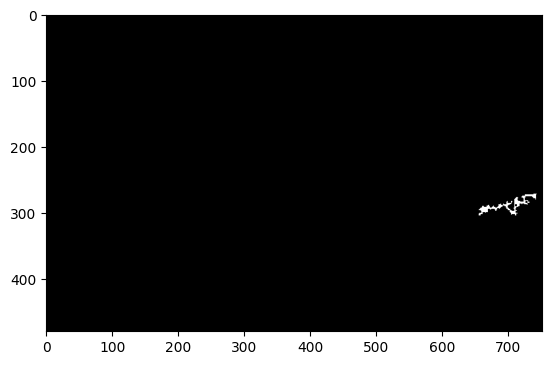

1


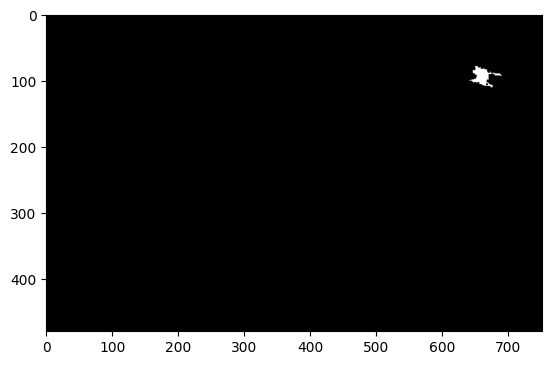

2


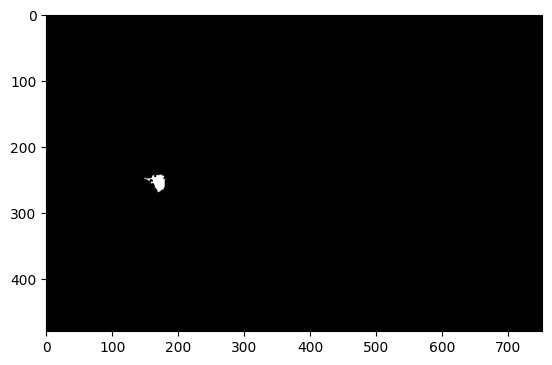

3


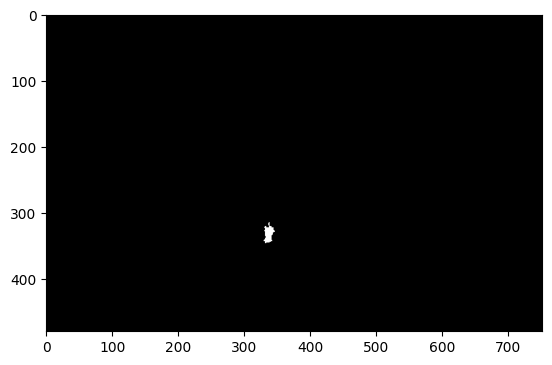

4


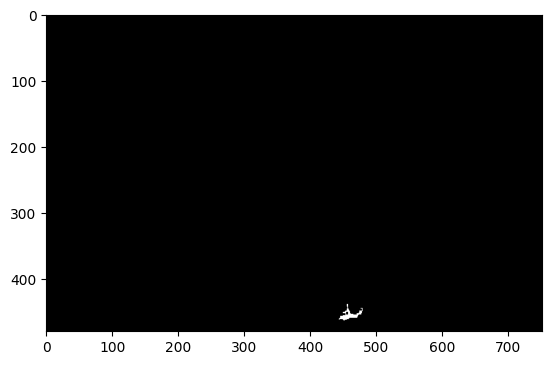

5


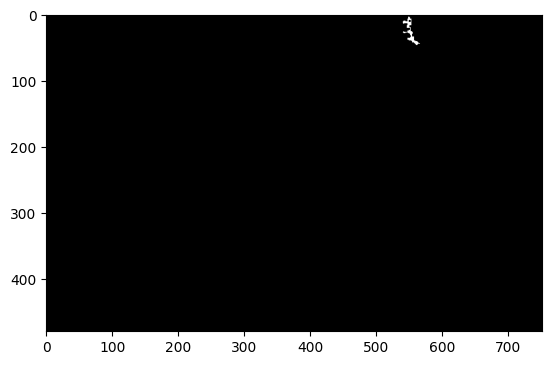

6


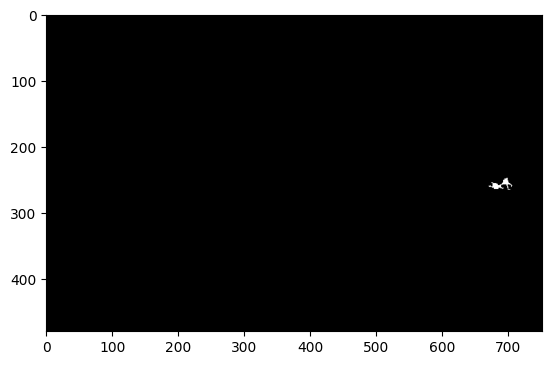

7


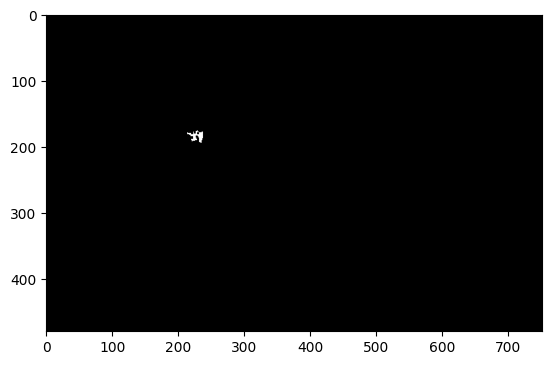

8


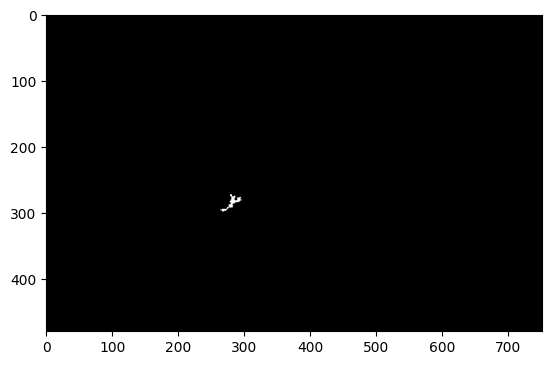

9


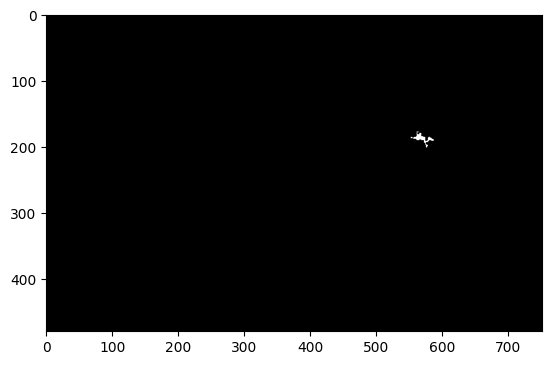

10


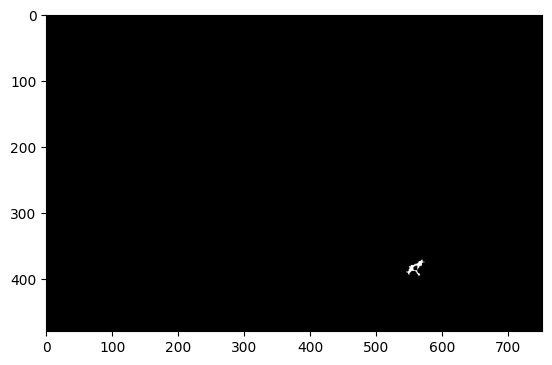

11


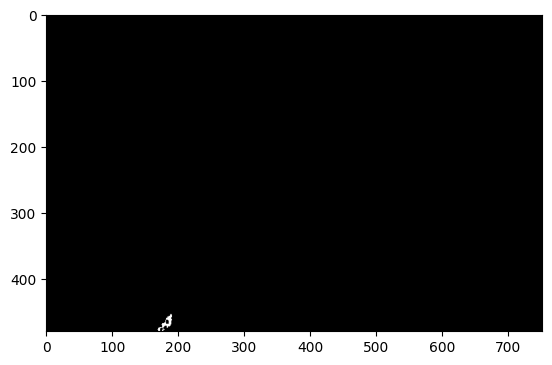

12


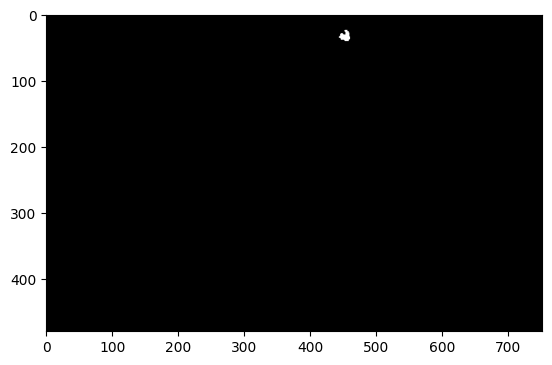

13


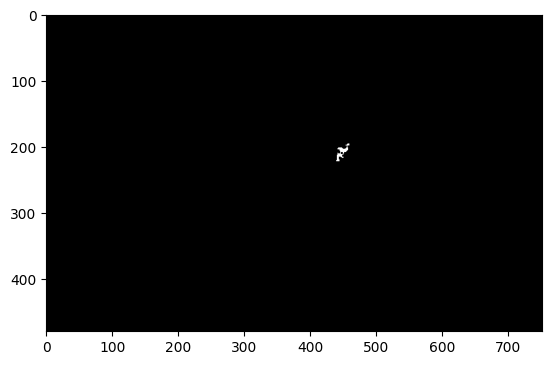

14


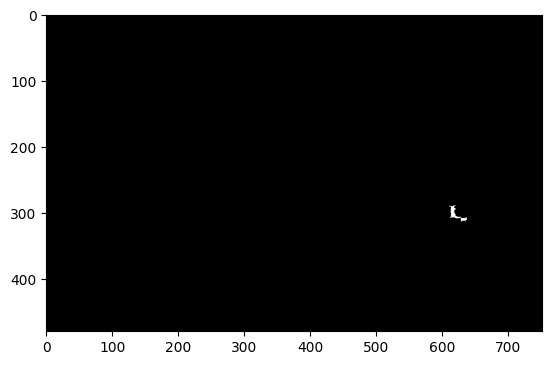

15


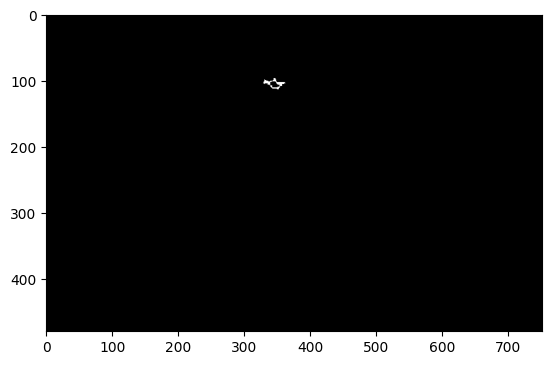

16


In [15]:
# Generate one mask per particle 
#  uses erosion and ranking to minimize the amount of particles 
#  takes the top_perc biggest ones
def generate_masks(mask, top_perc = .1):
    # mask is greyscale
    
    # Create a kernel for erosion
    kernel = np.ones((3, 3), np.uint8)

    # Perform erosion
    eroded_mask = cv2.erode(mask, kernel, iterations=1)
    
    
    # Find connected components
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(eroded_mask, connectivity=4)
    
    # Sort the connected components by area (largest first)
    areas = stats[1:, cv2.CC_STAT_AREA]
    sorted_indices = np.argsort(areas)[::-1]  # Reverse order to get largest first
    sorted_indices = sorted_indices[:int(top_perc * len(sorted_indices))]  # Consider only the top 10% components
    

    # Generate separate masks for the selected components
    masks = []
    for i in sorted_indices:
        mask = np.uint8(labels == i + 1)  # Create a mask for the component
        mask = (mask * 255).astype(np.uint8)
        masks.append(mask)

    return masks





# TESTS - because all components empty
# Load the image
fullmaskimg_list = [img for img in os.listdir(full_mask_dir) if img.endswith('.jpg')]

test_path_1 = fullmaskimg_list[0]
mask_path = os.path.join(full_mask_dir, test_path_1)
img = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

print(img.dtype)
islands = generate_masks(img)

# Display the masks
print(f"There are {len(islands)} particles in the top 5% biggest. ")
for i, mask in enumerate(islands):
    print(i)
    if(i > 15):
        break
    plt.imshow(mask,cmap = 'gray')
    plt.show()




## Get masks and split annotations to one per particle



Naming convention: 


The full masks are named like this: 

    FM_IMGID_TILEID_cr_Name_of_the_image.jpg


The first fields are fixed: FM for Full Mask, and cr for "cropped", the name of the image is random (because). 

    IMGID_TILEID_cr_Name_of_the_image_particle_PID.png

    

In [16]:

# Paths from above.

full_mask_dir = full_mask_annotations_dir = data_dir + "/01-01_image_library/V2/3_full_masks/" # One binary image per tile
split_mask_dir = split_mask_annotations_dir = data_dir + "/01-01_image_library/V2/5_coco_annotations/train/annotations" # One binary image per particle (~) 

DO = True
SAVE = True


fullmaskimg_list = [img for img in os.listdir(full_mask_dir) if img.endswith('.jpg')]




for i, fullmaskimg in enumerate(fullmaskimg_list[4:]):
    
    if not DO:
        break
    
    print("---------------------------------")
    print(f"     Processing mask {i} - {fullmaskimg}")
    print("---------------------------------")
    
    mask_path = os.path.join(full_mask_dir, fullmaskimg)
    img = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    
    # Get list of images, containing one island (particle) each.
    islands = generate_masks(img)
    
    # For each island, save a separate image file
    for j, island in enumerate(islands):
        
        # Name each annotation according to the guidelines https://patrickwasp.com/create-your-own-coco-style-dataset/
        
        new_name = fullmaskimg.replace("FM_", "", 1)
        new_name = os.path.splitext(new_name)[0] # Removes extension
        new_name = new_name + "_particle_" + str(j) + ".png"
        island_img_path = os.path.join(split_mask_dir, new_name)
        
        #print(f"Island {j} path: {island_img_path}")
        
        
        # Save image
        if SAVE:
            img_island = Image.fromarray(island)
            img_island.save(island_img_path, format="PNG")
    
# If necessary delete the huge output fromt he terminal:
# https://janakiev.com/blog/jupyter-git-remove-output/ 

---------------------------------
     Processing mask 0 - FM_8_1_cr_WP4_SCH_M1_F_15_Mozaik.jpg
---------------------------------
---------------------------------
     Processing mask 1 - FM_165_3_cr_WP4_SCH_M1_F_2_Mozaik.jpg
---------------------------------
---------------------------------
     Processing mask 2 - FM_46_1_cr_jpg_WP4_SRB_1_M_5_Mozaik.jpg
---------------------------------
---------------------------------
     Processing mask 3 - FM_96_1_cr_WP3_UBFC_V1_F002V_Image_dark.jpg
---------------------------------
---------------------------------
     Processing mask 4 - FM_156_7_cr_WP3_UBFC_F_R_001_H2O2_WP3_UBFC_F_R_001_H2O2.jpg
---------------------------------
---------------------------------
     Processing mask 5 - FM_30_1_cr_WP4_SCH_V1_F_013_Image.jpg
---------------------------------
---------------------------------
     Processing mask 6 - FM_107_7_cr_WP4_SCH_V1_F_028_Image_light.jpg
---------------------------------
---------------------------------
     Processi

## Convert annotations files to coco annotations 

In [ ]:
# Delete single particle images after convertion 

# Paths from above.
#coco_annotations_dir = data_dir + "/01-01_image_library/V2/5_coco_annotations/"



In [44]:

from pycocotools.coco import COCO
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt
import pylab
import datetime
import json
import os
import re
import fnmatch
from PIL import Image
import numpy as np
from pycococreatortools import pycococreatortools

INFO = {
    "description": "Particle Dataset",
    "url": "https://github.com/waspinator/pycococreator",
    "version": "0.1.0",
    "year": 2022,
    "contributor": "waspinator",
    "date_created": datetime.datetime.utcnow().isoformat(' ')
}

LICENSES = [
    {
        "id": 1,
        "name": "Attribution-NonCommercial-ShareAlike License",
        "url": "http://creativecommons.org/licenses/by-nc-sa/2.0/"
    }
]

CATEGORIES = [
    {
        'id': 1,
        'name': 'particle',
        'supercategory': 'particles',
    },
]

In [45]:
BYPASS = False # don't do that twice, it takes time !

full_mask_annotations_dir = data_dir + "/01-01_image_library/V2/3_full_masks/"
split_mask_annotations_dir = data_dir + "/01-01_image_library/V2/5_coco_annotations/train/annotations"



COCO_DIR = data_dir + "/01-01_image_library/V2/5_coco_annotations"
IMAGE_DIR = data_dir + "/01-01_image_library/V2/2_752x480_tiles/jpg/"
ANNOTATION_DIR = split_mask_annotations_dir



def filter_for_jpeg(root, files):
    file_types = ['*.jpeg', '*.jpg']
    file_types = r'|'.join([fnmatch.translate(x) for x in file_types])
    files = [os.path.join(root, f) for f in files]
    files = [f for f in files if re.match(file_types, f)]
    
    return files


# BE CAREFULL WITH THIS ANNOYING FUNCTION
def filter_for_annotations(root, files, image_filename):
    files = [os.path.join(root, f) for f in files if f.endswith(".png")] # List of all annotation files (with path)
    annotation_files = [f for f in files if image_filename in f]
    
    #file_types = ['*.jpg']
    #file_types = r'|'.join([fnmatch.translate(x) for x in file_types])
    
    #files = [os.path.join(root, f) for f in files] # List of all annotation files (with path)
    #files = [f for f in files if image_filename in f]

    return annotation_files

def main(IMAGE_DIR, ANNOTATION_DIR):

    coco_output = {
        "info": INFO,
        "licenses": LICENSES,
        "categories": CATEGORIES,
        "images": [],
        "annotations": []
    }

    image_id = 1
    segmentation_id = 1
    
    all_annotation_files = [os.path.join(ANNOTATION_DIR, file) for file in os.listdir(ANNOTATION_DIR) if file.endswith('.png')]
    
    print(f"Number of annotation files: {len(all_annotation_files)}")
    
    # filter for jpeg images
    for root, _, files in os.walk(IMAGE_DIR):
        image_files = filter_for_jpeg(root, files)
        
        # TEST MODE
        #image_files = image_files[:5]
        
        print(f"Number of images: {len(image_files)}")
        
        # go through each image
        for image_filename in image_files:
            image = Image.open(image_filename)
            image_info = pycococreatortools.create_image_info(image_id, os.path.basename(image_filename), image.size)
            
            coco_output["images"].append(image_info)
            
            print(f"Image with path {image_filename}")
            
            image_basename = os.path.splitext(os.path.basename(image_filename))[0]
            # filter for associated annotations. Files is a list of filenames in root. 
            #for root, _, files in os.walk(ANNOTATION_DIR):   
            #files = [os.path.join(root, f) for f in files if f.endswith(".jpg")] # List of all annotation files (with path)
            
            
            annotation_files = [f for f in all_annotation_files if image_basename in f]
            #annotation_files = filter_for_annotations(root, files, image_filename) # PROBLEM HERE - Too Much Files
            print(f"Matching annotation files: {len(annotation_files)}")

            # go through each associated annotation
            for annotation_filename in annotation_files:

                #print(f"Annotation filename: {annotation_filename}")
                class_id = [x['id'] for x in CATEGORIES][0] #if x['name'] in annotation_filename][0]
                #class_id = [1 for x in CATEGORIES]

                #category_info = {'id': class_id, 'is_crowd': 'crowd' in image_filename}
                category_info = {'id': class_id, 'is_crowd': 0} 
                # Is Crowd means: don't train on it. Use semantic segmentation instead of instance.

                binary_mask = np.asarray(Image.open(annotation_filename).convert('1')).astype(np.uint8)
                
                
                annotation_info = pycococreatortools.create_annotation_info(
                    segmentation_id, 
                    image_id, 
                    category_info, 
                    binary_mask, 
                    image.size, 
                    tolerance=2)
                

                if annotation_info is not None:
                    #print("Not none")
                    coco_output["annotations"].append(annotation_info)


                segmentation_id = segmentation_id + 1

            image_id = image_id + 1
        

    with open('{}/instances_particles_train2023.json'.format(COCO_DIR), 'w') as output_json_file:
        json.dump(coco_output, output_json_file)
    return(coco_output)


if __name__ == "__main__":
    

    
   
    ## ----------------------------
    
    if(not BYPASS):
        print("Convert binary masks to coco annotations.")
        
        
        
        coco_output = main(IMAGE_DIR, ANNOTATION_DIR)
        print("Done!")
    else:
        print("Bypassing coco annotation creation.")

Convert binary masks to coco annotations.
Number of annotation files: 349910
Number of images: 1227
Image with path ../../../0_DATA/IMPTOX/01-01_image_library/V2/2_752x480_tiles/jpg/124_0_cr_WP4_SCH_M1_F_29_Mozaik.jpg
Matching annotation files: 390
Image with path ../../../0_DATA/IMPTOX/01-01_image_library/V2/2_752x480_tiles/jpg/168_6_cr_WP3_UBFC_F_R_012_Image.jpg
Matching annotation files: 202
Image with path ../../../0_DATA/IMPTOX/01-01_image_library/V2/2_752x480_tiles/jpg/42_6_cr_WP4_SCH_M1_F_1_Mozaik.jpg
Matching annotation files: 201
Image with path ../../../0_DATA/IMPTOX/01-01_image_library/V2/2_752x480_tiles/jpg/70_3_cr_WP4_GK_Mc01_2Y_F_12_Image.jpg
Matching annotation files: 336
Image with path ../../../0_DATA/IMPTOX/01-01_image_library/V2/2_752x480_tiles/jpg/19_4_cr_WP4_SCH_V1_F_015_Image.jpg
Matching annotation files: 353
Image with path ../../../0_DATA/IMPTOX/01-01_image_library/V2/2_752x480_tiles/jpg/101_4_cr_WP4_SCH_V1_F_023_Image_light.jpg
Matching annotation files: 209
I

## Visualize the coco annotations



In [23]:
COCO_DIR

'../../../0_DATA/IMPTOX/01-01_image_library/V2/5_coco_annotations'

In [46]:
image_directory = IMAGE_DIR
annotation_file = COCO_DIR + '/instances_particles_train2023.json'

example_coco = COCO(annotation_file)


loading annotations into memory...
Done (t=5.45s)
creating index...
index created!


In [47]:
categories = example_coco.loadCats(example_coco.getCatIds())
category_names = [category['name'] for category in categories]
print('Custom COCO categories: \n{}\n'.format(' '.join(category_names)))

category_names = set([category['supercategory'] for category in categories])
print('Custom COCO supercategories: \n{}'.format(' '.join(category_names)))

category_ids = example_coco.getCatIds(catNms=['particle'])#square
image_ids = example_coco.getImgIds(catIds=category_ids)

print(f"Image ids: {image_ids}")

Custom COCO categories: 
particle

Custom COCO supercategories: 
particles
Image ids: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 2

{'id': 1165, 'file_name': '85_5_cr_WP4_SCH_M1_F_28_Mozaik.jpg', 'width': 752, 'height': 480, 'date_captured': '2023-07-05 07:51:11.180776', 'license': 1, 'coco_url': '', 'flickr_url': ''}


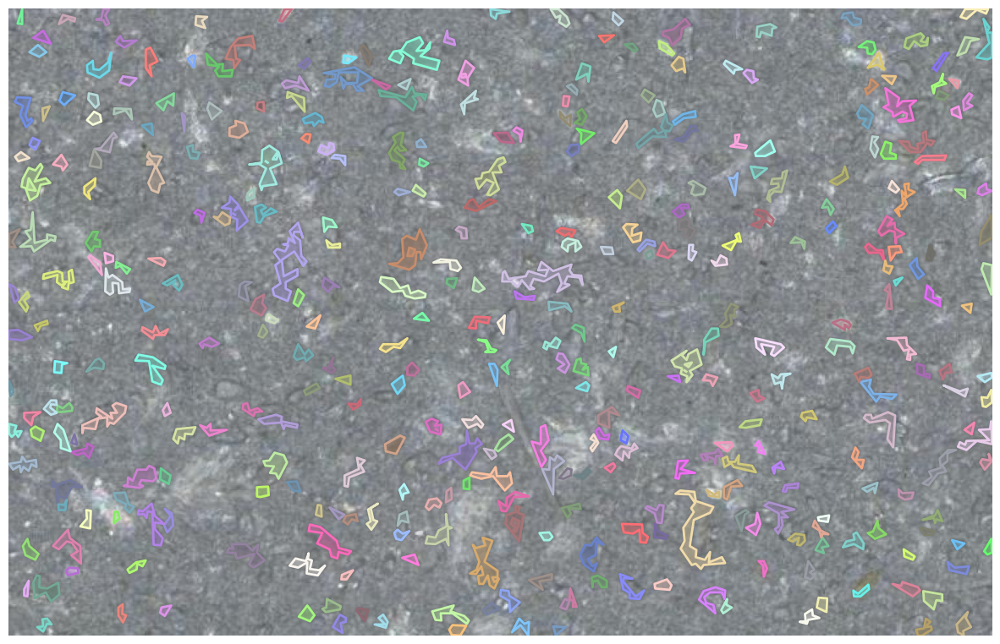

In [96]:

random_id = np.random.randint(0, len(image_ids))

image_data = example_coco.loadImgs(image_ids[random_id])[0]
print(image_data)


# load and display instance annotations
image = io.imread(image_directory + image_data['file_name'])

plt.imshow(image); plt.axis('off')
pylab.rcParams['figure.figsize'] = (15.0, 20.0)
annotation_ids = example_coco.getAnnIds(imgIds=image_data['id'], catIds=category_ids, iscrowd=None)
annotations = example_coco.loadAnns(annotation_ids)
example_coco.showAnns(annotations)

# Convert 256x256 square masks to COCO annotations



## Generate one mask per particle

In [8]:
from pycocotools.coco import COCO
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt
import pylab
import datetime
import json
import os
import re
import fnmatch
from PIL import Image
import numpy as np
from pycococreatortools import pycococreatortools
import cv2 

In [17]:
# Generate one mask per particle 
#  uses erosion and ranking to minimize the amount of particles 
#  takes the top_perc biggest ones
def generate_masks(mask, top_perc = 1):
    # mask is greyscale
    
    # Create a kernel for erosion
    kernel = np.ones((3, 3), np.uint8)

    # Perform erosion
    eroded_mask = cv2.erode(mask, kernel, iterations=1)
    
    
    # Find connected components
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(eroded_mask, connectivity=4)
    
    # Sort the connected components by area (largest first)
    areas = stats[1:, cv2.CC_STAT_AREA]
    sorted_indices = np.argsort(areas)[::-1]  # Reverse order to get largest first
    sorted_indices = sorted_indices[:int(top_perc * len(sorted_indices))]  # Consider only the top 10% components
    

    # Generate separate masks for the selected components
    masks = []
    for i in sorted_indices:
        mask = np.uint8(labels == i + 1)  # Create a mask for the component
        mask = (mask * 255).astype(np.uint8)
        masks.append(mask)

    return masks

In [18]:
# Paths from above.


data_dir = '/home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data'

full_mask_annotations_dir = os.path.join(data_dir, "uFTIR_square_dataset/Ground_Truth")
split_mask_annotations_dir = os.path.join(data_dir, "uFTIR_square_coco/split_mask")



COCO_DIR = os.path.join(data_dir, "uFTIR_square_coco")
IMAGE_DIR = os.path.join(data_dir, "uFTIR_square_dataset/Training_Images")
ANNOTATION_DIR = split_mask_annotations_dir



full_mask_dir = full_mask_annotations_dir 
split_mask_dir = split_mask_annotations_dir 

SAVE = False


fullmaskimg_list = [img for img in os.listdir(full_mask_dir) if img.endswith('.png')]
print(len(fullmaskimg_list))



1368


In [19]:
for i, fullmaskimg in enumerate(fullmaskimg_list):
    break
    
    print("---------------------------------")
    print(f"     Processing mask {i} - {fullmaskimg}")
    print("---------------------------------")
    
    mask_path = os.path.join(full_mask_dir, fullmaskimg)
    img = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    
    # Get list of images, containing one island (particle) each.
    islands = generate_masks(img)
    
    # For each island, save a separate image file
    for j, island in enumerate(islands):
        
        # Name each annotation according to the guidelines https://patrickwasp.com/create-your-own-coco-style-dataset/
        
        #new_name = fullmaskimg.replace("FM_", "", 1)
        
        new_name = os.path.splitext(fullmaskimg)[0] # Removes extension
        new_name = new_name + "_particle_" + str(j) + ".png"
        island_img_path = os.path.join(split_mask_dir, new_name)
        
        print(f"Island {j} path: {island_img_path}")
        
        
        # Save image
        if SAVE:
            img_island = Image.fromarray(island)
            img_island.save(island_img_path, format="PNG")
    
    
# If necessary delete the huge output fromt he terminal:
# https://janakiev.com/blog/jupyter-git-remove-output/ 

---------------------------------
     Processing mask 0 - 54.png
---------------------------------
Island 0 path: /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/split_mask/54_particle_0.png
Island 1 path: /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/split_mask/54_particle_1.png
Island 2 path: /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/split_mask/54_particle_2.png
Island 3 path: /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/split_mask/54_particle_3.png
Island 4 path: /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/split_mask/54_particle_4.png
Island 5 path: /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/split_mask/54_particle_5.png
Island 6 path: /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/split_mask/54_particle_6.p

In [20]:


INFO = {
    "description": "Particle Dataset",
    "url": "https://github.com/waspinator/pycococreator",
    "version": "0.3.0",
    "year": 2023,
    "contributor": "waspinator",
    "date_created": datetime.datetime.utcnow().isoformat(' ')
}

LICENSES = [
    {
        "id": 1,
        "name": "Attribution-NonCommercial-ShareAlike License",
        "url": "http://creativecommons.org/licenses/by-nc-sa/2.0/"
    }
]

CATEGORIES = [
    {
        'id': 1,
        'name': 'particle',
        'supercategory': 'particles',
    },
]

In [36]:

def filter_for_jpeg(root, files):
    file_types = ['*.jpeg', '*.jpg']
    file_types = r'|'.join([fnmatch.translate(x) for x in file_types])
    files = [os.path.join(root, f) for f in files]
    files = [f for f in files if re.match(file_types, f)]

    return files


In [41]:
BYPASS = False # don't do that twice, it takes time !

data_dir = '/home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data'

split_mask_annotations_dir = os.path.join(data_dir, "uFTIR_square_coco/split_mask")



COCO_DIR = os.path.join(data_dir, "uFTIR_square_coco")
IMAGE_DIR = os.path.join(data_dir, "uFTIR_square_coco/Training_Images")
ANNOTATION_DIR = split_mask_annotations_dir



def main(IMAGE_DIR, ANNOTATION_DIR):

    coco_output = {
        "info": INFO,
        "licenses": LICENSES,
        "categories": CATEGORIES,
        "images": [],
        "annotations": []
    }

    image_id = 1
    segmentation_id = 1
    
    all_annotation_files = [os.path.join(ANNOTATION_DIR, file) for file in os.listdir(ANNOTATION_DIR) if file.endswith('.png')]
    
    print(f"Number of annotation files: {len(all_annotation_files)}")
    
    # filter for jpeg images
    for root, _, files in os.walk(IMAGE_DIR):
        image_files = filter_for_jpeg(root, files)
        
        # TEST MODE
        #image_files = image_files[:5]
        
    
    
        print("------------------------------------------")
        print(f"Number of images: {len(image_files)}")
        
        # go through each image
        for image_filename in image_files:
            image = Image.open(image_filename)
            image_info = pycococreatortools.create_image_info(image_id, os.path.basename(image_filename), image.size)
            
            coco_output["images"].append(image_info)
            
            print(f"Image with path {image_filename}")
            
            image_basename = os.path.splitext(os.path.basename(image_filename))[0]
            # filter for associated annotations. Files is a list of filenames in root. 
            #for root, _, files in os.walk(ANNOTATION_DIR):   
            #files = [os.path.join(root, f) for f in files if f.endswith(".jpg")] # List of all annotation files (with path)
            
            print(f"Image basename: {image_basename}")
            annotation_files = [f for f in all_annotation_files if os.path.basename(f).startswith(image_basename + "_particle_")]
            print(f"Matching annotation files: {len(annotation_files)}")
            
            for af in annotation_files:
                print(f"-: {af}")

            # go through each associated annotation
            for annotation_filename in annotation_files:

                #print(f"Annotation filename: {annotation_filename}")
                class_id = [x['id'] for x in CATEGORIES][0] #if x['name'] in annotation_filename][0]
                #class_id = [1 for x in CATEGORIES]

                #category_info = {'id': class_id, 'is_crowd': 'crowd' in image_filename}
                category_info = {'id': class_id, 'is_crowd': 0} 
                # Is Crowd means: don't train on it. Use semantic segmentation instead of instance.

                binary_mask = np.asarray(Image.open(annotation_filename).convert('1')).astype(np.uint8)
                
                annotation_info = pycococreatortools.create_annotation_info(
                    segmentation_id, 
                    image_id, 
                    category_info, 
                    binary_mask, 
                    image.size, 
                    tolerance=2)
                

                if annotation_info is not None:
                    #print("Not none")
                    coco_output["annotations"].append(annotation_info)


                segmentation_id = segmentation_id + 1

            image_id = image_id + 1
        

    
    with open('{}/instances_particles_square2023.json'.format(COCO_DIR), 'w') as output_json_file:
        json.dump(coco_output, output_json_file)
        
    return(coco_output)


if __name__ == "__main__":
    
    print("Convert binary masks to coco annotations.")
    coco_output = main(IMAGE_DIR, ANNOTATION_DIR)
    print("Done!")
    

Convert binary masks to coco annotations.
Number of annotation files: 38317
------------------------------------------
Number of images: 1368
Image with path /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/Training_Images/177.jpg
Image basename: 177
Matching annotation files: 18
-: /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/split_mask/177_particle_2.png
-: /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/split_mask/177_particle_16.png
-: /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/split_mask/177_particle_5.png
-: /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/split_mask/177_particle_1.png
-: /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/split_mask/177_particle_7.png
-: /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/spli

/home/thibault.schowing/data-local/miniconda3/envs/aienv/lib/python3.11/site-packages/pycococreatortools/pycococreatortools.py:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  contours = np.subtract(contours, 1)


Image with path /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/Training_Images/698.jpg
Image basename: 698
Matching annotation files: 36
-: /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/split_mask/698_particle_21.png
-: /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/split_mask/698_particle_30.png
-: /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/split_mask/698_particle_15.png
-: /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/split_mask/698_particle_19.png
-: /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/split_mask/698_particle_8.png
-: /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/split_mask/698_particle_12.png
-: /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/split_mask/698_particle_

## Check the annotations



In [42]:
# IMAGE_DIR
# COCO_DIR
annotation_file = os.path.join(COCO_DIR, 'instances_particles_square2023.json')

example_coco = COCO(annotation_file)

loading annotations into memory...
Done (t=0.51s)
creating index...
index created!


In [43]:
categories = example_coco.loadCats(example_coco.getCatIds())
category_names = [category['name'] for category in categories]
print('Custom COCO categories: \n{}\n'.format(' '.join(category_names)))

category_names = set([category['supercategory'] for category in categories])
print('Custom COCO supercategories: \n{}'.format(' '.join(category_names)))

category_ids = example_coco.getCatIds(catNms=['particle'])#square
image_ids = example_coco.getImgIds(catIds=category_ids)

print(f"Image ids: {image_ids}")

Custom COCO categories: 
particle

Custom COCO supercategories: 
particles
Image ids: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 2

{'id': 834, 'file_name': '1033.jpg', 'width': 256, 'height': 255, 'date_captured': '2023-10-25 11:30:58.004754', 'license': 1, 'coco_url': '', 'flickr_url': ''}


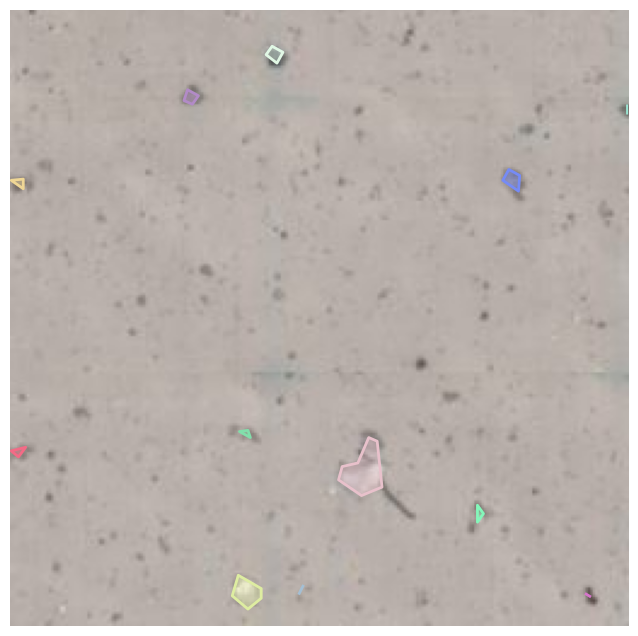

In [65]:
random_id = np.random.randint(0, len(image_ids))

image_data = example_coco.loadImgs(image_ids[random_id])[0]
print(image_data)


# load and display instance annotations
image = io.imread(os.path.join(IMAGE_DIR, image_data['file_name']))

plt.imshow(image); plt.axis('off')
annotation_ids = example_coco.getAnnIds(imgIds=image_data['id'], catIds=category_ids, iscrowd=None)
annotations = example_coco.loadAnns(annotation_ids)
example_coco.showAnns(annotations)